**DISCLAIMER** : This notebook is still under construction.

In [0]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [0]:
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns

matplotlib.style.use(['seaborn-talk', 'seaborn-ticks', 'seaborn-whitegrid'])

In [0]:
df_inspections = pd.read_csv("https://drive.switch.ch/index.php/s/nlURni4cnxItrbn/download")

In [299]:
df_inspections.sample()

,Inspection ID,DBA Name,AKA Name,License #,Facility Type,Risk,Address,City,State,Zip,Inspection Date,Inspection Type,Results,Violations,Latitude,Longitude,Location
117538,1385589,Acad. Of Scholastic Ach,Acad. Of Scholastic Ach,69457.0,School,Risk 2 (Medium),4651 W Madison ST,CHICAGO,IL,60644.0,09/08/2014,Canvass,Pass,"34. FLOORS: CONSTRUCTED PER CODE, CLEANED, GOO...",41.88042,-87.742504,"(-87.74250355816393, 41.880420127309684)"


In [300]:
df_inspections.shape

(195979, 17)

In [301]:
df_inspections.dtypes

Inspection ID        int64
DBA Name            object
AKA Name            object
License #          float64
Facility Type       object
Risk                object
Address             object
City                object
State               object
Zip                float64
Inspection Date     object
Inspection Type     object
Results             object
Violations          object
Latitude           float64
Longitude          float64
Location            object
dtype: object

In [302]:
df_inspections["Inspection Date"] =  pd.to_datetime(df_inspections["Inspection Date"], format = "%m/%d/%Y")
print("Date of first report : " + str(df_inspections.iloc[-1]["Inspection Date"].year))
print("Date of last report : " + str(df_inspections.iloc[0]["Inspection Date"].year))

Date of first report : 2010
Date of last report : 2019


In [0]:
#Drop useless columns
df_inspections = df_inspections.drop(["AKA Name", "City", "State", "Location"], axis = 1)

In [304]:
df_inspections.head(3)

,Inspection ID,DBA Name,License #,Facility Type,Risk,Address,Zip,Inspection Date,Inspection Type,Results,Violations,Latitude,Longitude
0,2345699,JET'S PIZZA,2163956.0,Restaurant,Risk 2 (Medium),2811 N ASHLAND AVE,60657.0,2019-11-15,Canvass,Pass w/ Conditions,"1. PERSON IN CHARGE PRESENT, DEMONSTRATES KNOW...",41.932766,-87.668262
1,2345619,JAIPUR,2694084.0,Restaurant,Risk 1 (High),738 W RANDOLPH ST,60661.0,2019-11-14,Canvass,Pass,NaN,41.884518,-87.647304
2,2345616,VIP FIT CLUB,2446547.0,Restaurant,Risk 2 (Medium),3426 W DIVERSEY AVE,60647.0,2019-11-14,Complaint,Fail,"1. PERSON IN CHARGE PRESENT, DEMONSTRATES KNOW...",41.932069,-87.713294


In [305]:
df_inspections.tail(3)

,Inspection ID,DBA Name,License #,Facility Type,Risk,Address,Zip,Inspection Date,Inspection Type,Results,Violations,Latitude,Longitude
195976,48217,Hanson Park Branch,24462.0,School,Risk 1 (High),2318 N Lorel ST,60639.0,2010-01-13,Canvass,Pass,"34. FLOORS: CONSTRUCTED PER CODE, CLEANED, GOO...",41.922831,-87.759944
195977,88291,MS EGGROLL #2 INC,1222412.0,Restaurant,Risk 1 (High),6966 N GLENWOOD AVE,60626.0,2010-03-11,Complaint,Pass,33. FOOD AND NON-FOOD CONTACT EQUIPMENT UTENSI...,42.008692,-87.666350
195978,88238,"RICE AND ROLL, INC",2016897.0,Restaurant,Risk 1 (High),3312 W Foster AVE,60625.0,2010-02-02,License,Pass,NaN,41.975822,-87.711729


In [306]:
df_inspections["Results"].value_counts()

Pass                    105850
Fail                     37900
Pass w/ Conditions       27169
Out of Business          16866
No Entry                  6243
Not Ready                 1883
Business Not Located        68
Name: Results, dtype: int64

In [307]:
#Only keep fail and pass outcome (for now)
df_binary = df_inspections.query("Results == 'Fail' or Results == 'Pass'")
df_binary.sample(5)

,Inspection ID,DBA Name,License #,Facility Type,Risk,Address,Zip,Inspection Date,Inspection Type,Results,Violations,Latitude,Longitude
101108,1441972,KATHERINE ANNE CONFECTIONS,2247022.0,Bakery,Risk 1 (High),2745 W ARMITAGE AVE,60647.0,2015-07-14,Canvass,Pass,37. TOILET ROOM DOORS SELF CLOSING: DRESSING R...,41.917386,-87.696585
63251,2052211,BERNIE'S,1802415.0,Restaurant,Risk 1 (High),3664 N CLARK ST,60613.0,2017-06-29,Canvass,Pass,31. CLEAN MULTI-USE UTENSILS AND SINGLE SERVIC...,41.948844,-87.658009
125332,1439263,"HOMEMADE PIZZA COMPANY, L.L.C.",2094200.0,Restaurant,Risk 1 (High),209 E OHIO ST,60611.0,2014-04-24,Canvass Re-Inspection,Pass,"41. PREMISES MAINTAINED FREE OF LITTER, UNNECE...",41.892456,-87.622264
74811,1979188,DUNKIN DONUTS,1914093.0,Restaurant,Risk 2 (Medium),7059 S ASHLAND AVE,60636.0,2017-01-10,Canvass Re-Inspection,Pass,32. FOOD AND NON-FOOD CONTACT SURFACES PROPERL...,41.765004,-87.663654
189592,250549,MI CIUDAD RESTAURANT,22965.0,Restaurant,Risk 1 (High),3041 W IRVING PARK RD,60618.0,2010-06-03,Canvass,Pass,33. FOOD AND NON-FOOD CONTACT EQUIPMENT UTENSI...,41.953830,-87.704805


In [308]:
df_binary.shape

(143750, 13)

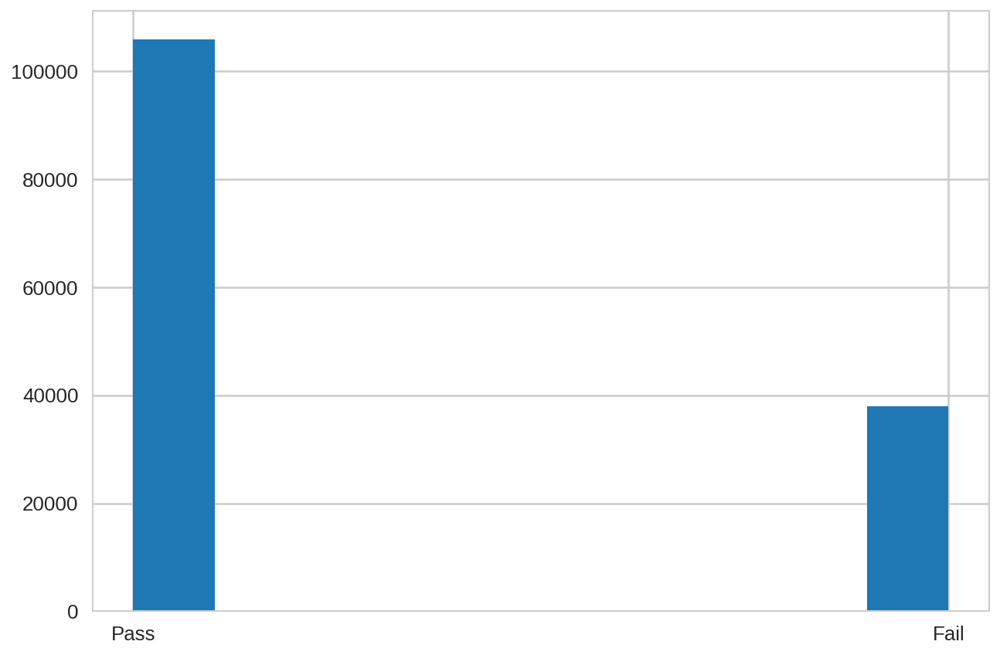

In [309]:
df_binary["Results"].hist()

In [310]:
#Show how many NaN there are in each columns.
df_binary.isna().sum()

Inspection ID          0
DBA Name               0
License #             15
Facility Type        620
Risk                  34
Address                0
Zip                   28
Inspection Date        0
Inspection Type        1
Results                0
Violations         26994
Latitude             543
Longitude            543
dtype: int64

In [311]:
#Drop the rows for which there is a missing : license #, zip, risk, inspection type, latitude, longitude
# We keep the Violations NaN because those are often empty for restaurants that passed the inspection.
df_binary = df_binary.dropna(subset = ["License #", "Risk", "Zip", "Inspection Type", "Latitude", "Longitude"])
df_binary.isna().sum()

Inspection ID          0
DBA Name               0
License #              0
Facility Type        597
Risk                   0
Address                0
Zip                    0
Inspection Date        0
Inspection Type        0
Results                0
Violations         26808
Latitude               0
Longitude              0
dtype: int64

In [312]:
#How many rows were dropped ? (143750 - 143130) = 620
df_binary.shape

(143130, 13)

In [313]:
#Risk column cleaning
df_binary["Risk"].value_counts()

Risk 1 (High)      104358
Risk 2 (Medium)     27756
Risk 3 (Low)        11011
All                     5
Name: Risk, dtype: int64

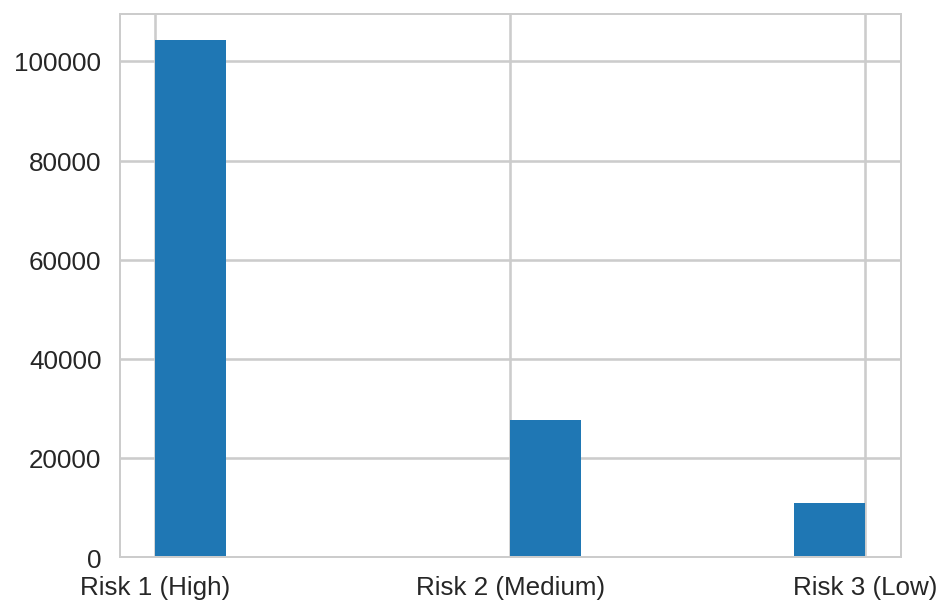

In [314]:
#Risk visualisation
df_binary = df_binary[df_binary["Risk"] != "All"]
df_binary["Risk"].hist(figsize = (7,5))

In [315]:
#Zip column cleaning
df_binary["Zip"] = df_binary["Zip"].astype(int)
zipList = list(df_binary["Zip"].unique())
print(min(zipList))
print(max(zipList))

60148
60827


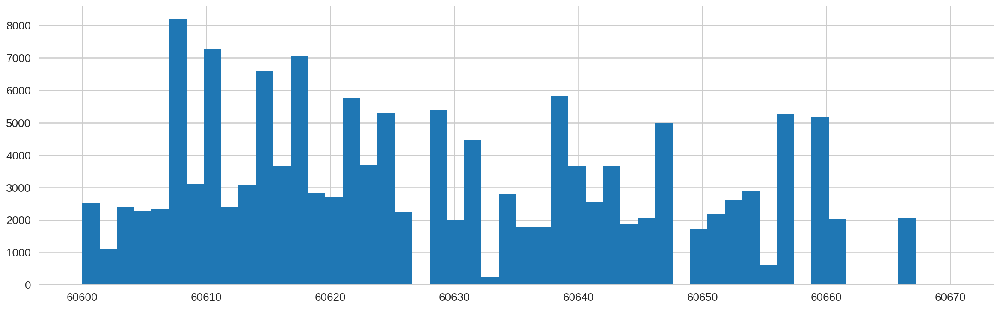

In [316]:
#Zip codes distribution (manually reduced the range as most zip codes are between those values)
df_binary["Zip"].hist(range = (60600, 60670), figsize = (20,6), bins = 50)

In [317]:
df_binary["Facility Type"].value_counts()
#Should be dealt with as some values are unique + mix of lower/upper case. One possibility is to drop this column and use another dataset from Chicago City to get the type.

Restaurant                                   94627
Grocery Store                                19085
School                                       10500
Children's Services Facility                  2444
Bakery                                        2183
                                             ...  
GAS STATION STORE                                1
1584-DAY CARE ABOVE 2 YEARS                      1
fitness center                                   1
DRUG STORE/W/ FOOD                               1
PREPACKAGE MEAL DISTRIBUTOR (1006 Retail)        1
Name: Facility Type, Length: 450, dtype: int64

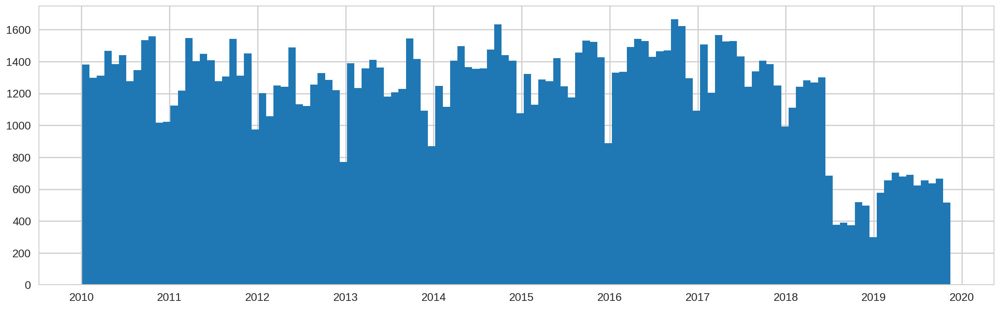

In [318]:
#Inspection date visualisation
df_binary["Inspection Date"].hist(bins = 118, figsize = (20,6))

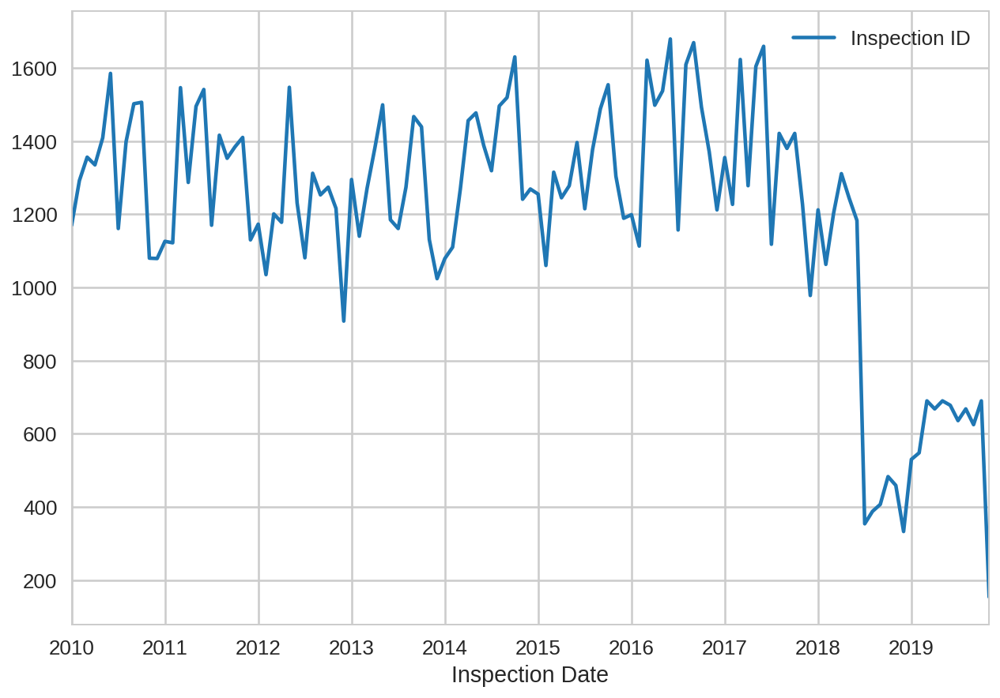

In [319]:
#Inspection date visualisation II (we see an important drop in july 2018 which corresponds to the legislation changes)
pivot_date = pd.pivot_table(data = df_binary, index = "Inspection Date", values = "Inspection ID", aggfunc = "count")
pivot_date.resample('1M').sum().plot()

In [0]:
#Split DF according to year and inspection result
from datetime import datetime

years = []

for i in range(2010, 2020) :
  years.append(str(i))

df_year = []
df_fail = []
df_pass = []

for k in range(len(years)) :
  date1 = datetime.strptime(years[k] + '-01-01', '%Y-%m-%d')
  date2 = datetime.strptime(years[k] + '-12-31', '%Y-%m-%d')

  df_year.append(df_binary.loc[(df_binary['Inspection Date']>=date1) & (df_binary['Inspection Date']<=date2)])

  df_fail.append(df_year[k][df_year[k]["Results"] == "Fail"])
  df_pass.append(df_year[k][df_year[k]["Results"] == "Pass"])

In [321]:
#Folium install
!pip install folium

In [322]:
#Map the data
import folium

map = folium.Map(location=[41.881944, -87.627778], tiles="OpenStreetMap", zoom_start=11)

#Select a year to visualise : 0 to 9 which corresponds to 2010 to 2019
myYear = 5

#Mapping passed inspections in green
for j in range(len(df_pass[myYear])) :
  folium.Circle(
      location = [df_pass[myYear].iloc[j]["Latitude"], df_pass[myYear].iloc[j]["Longitude"]],
      radius = 5,
      color = "green",
      opacity = 0.5,
  ).add_to(map)

#Mapping failed inspections in red
for i in range(len(df_fail[myYear])) :
  folium.Circle(
      location = [df_fail[myYear].iloc[i]["Latitude"], df_fail[myYear].iloc[i]["Longitude"]],
      radius = 5,
      color = "red",
      opacity = 0.5,
  ).add_to(map)

map